In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [19]:
def parser_data(year_value):
    print(f'Parser year {year_value}')
    df = pd.read_csv(f'data/enem_resume_{year_value}.csv')
    df.loc[df['NU_NOTA_REDACAO']=='.','NU_NOTA_REDACAO'] = np.nan  
    df = df.astype({'NU_NOTA_REDACAO': 'float','NU_INSCRICAO':'string','NU_ANO':'string' })  
    df = df.dropna()
    return df

In [20]:
df_totaly= parser_data(2019)
df_totaly.shape

Parser year 2019


(1000256, 14)

In [21]:
df_totaly.head(10)

,NU_INSCRICAO,NU_ANO,NU_IDADE,TP_SEXO,TP_COR_RACA,SG_UF_ESC,Q001,Q002,NU_NOTA_COMP1,NU_NOTA_COMP2,NU_NOTA_COMP3,NU_NOTA_COMP4,NU_NOTA_COMP5,NU_NOTA_REDACAO
2,190001004629,2019,18,F,1,PA,H,E,140.0,120.0,120.0,140.0,120.0,640.0
7,190001004634,2019,26,F,3,PA,B,B,120.0,120.0,120.0,120.0,0.0,480.0
15,190001004642,2019,17,F,3,PA,B,D,160.0,140.0,120.0,120.0,120.0,660.0
16,190001004643,2019,17,F,3,PA,E,E,120.0,100.0,100.0,120.0,100.0,540.0
24,190001004651,2019,18,F,3,PA,E,E,140.0,120.0,120.0,80.0,120.0,580.0
30,190001004657,2019,17,M,3,PA,D,B,120.0,120.0,100.0,160.0,140.0,640.0
49,190001004676,2019,17,F,3,PA,C,D,160.0,200.0,200.0,200.0,180.0,940.0
51,190001004678,2019,17,M,3,PA,H,E,120.0,120.0,120.0,120.0,0.0,480.0
61,190001004688,2019,18,F,2,PA,B,B,120.0,120.0,120.0,120.0,100.0,580.0
69,190001004696,2019,18,F,1,PA,C,D,160.0,120.0,140.0,160.0,160.0,740.0


In [22]:
df_totaly['NOTA_SUM'] = (df_totaly['NU_NOTA_COMP1']+df_totaly['NU_NOTA_COMP2']+df_totaly['NU_NOTA_COMP3']+df_totaly['NU_NOTA_COMP4']+df_totaly['NU_NOTA_COMP5']+df_totaly['NU_NOTA_REDACAO'])

In [23]:
df_totaly.describe().round(2)

,NU_IDADE,TP_COR_RACA,NU_NOTA_COMP1,NU_NOTA_COMP2,NU_NOTA_COMP3,NU_NOTA_COMP4,NU_NOTA_COMP5,NU_NOTA_REDACAO,NOTA_SUM
count,1000256.00,1000256.00,1000256.00,1000256.00,1000256.00,1000256.00,1000256.00,1000256.00,1000256.00
mean,18.01,2.10,119.83,122.95,114.55,122.51,94.13,573.96,1147.92
std,2.67,1.03,34.95,44.78,41.60,39.89,60.40,197.53,395.06
min,2.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,17.00,1.00,100.00,120.00,100.00,100.00,40.00,480.00,960.00
50%,18.00,2.00,120.00,120.00,120.00,120.00,100.00,580.00,1160.00
75%,18.00,3.00,140.00,140.00,140.00,140.00,140.00,680.00,1360.00
max,77.00,5.00,200.00,200.00,200.00,200.00,200.00,1000.00,2000.00


<AxesSubplot:xlabel='Q001', ylabel='NOTA_SUM'>

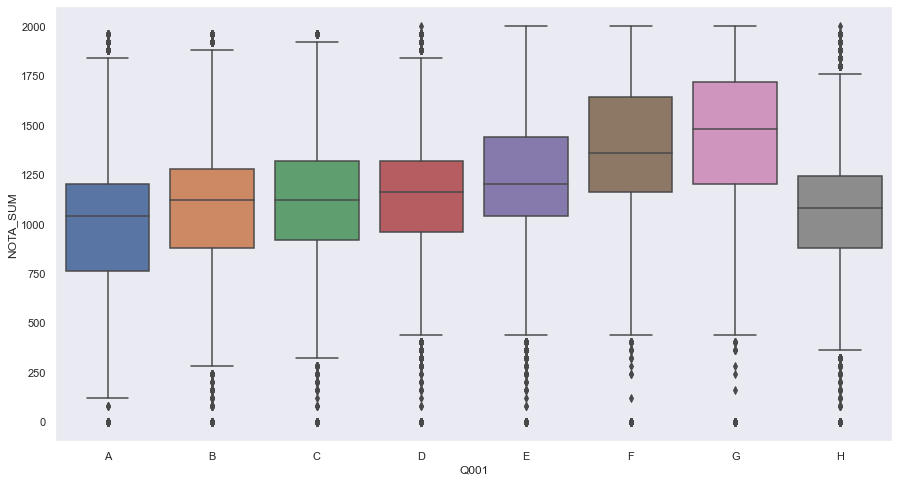

In [36]:
fig, ax = plt.subplots(figsize=(15,8))
sns.set_theme(style="dark")
sns.boxplot(x="Q001", 
            y="NOTA_SUM",            
            data=df_totaly,order=df_totaly["Q001"].drop_duplicates().sort_values().values,ax=ax)

<AxesSubplot:xlabel='Q002', ylabel='NOTA_SUM'>

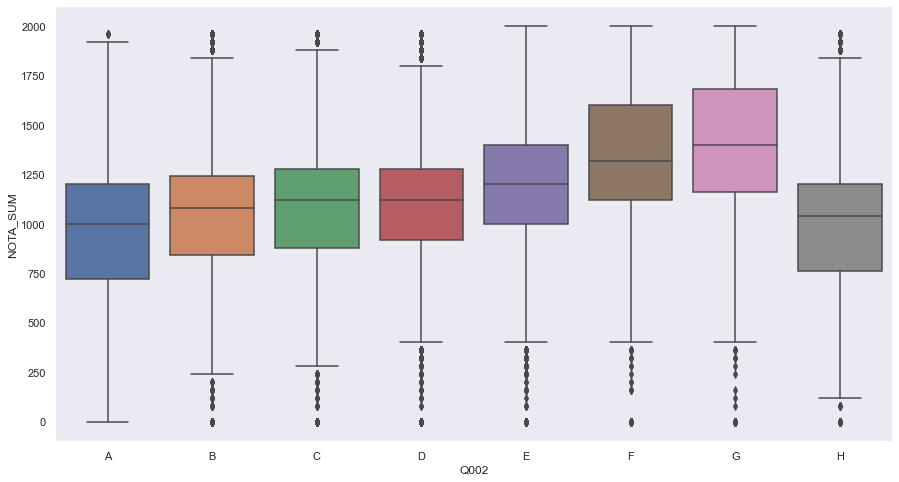

In [38]:
fig, ax = plt.subplots(figsize=(15,8))
sns.set_theme(style="dark")
sns.boxplot(x="Q002", 
            y="NOTA_SUM",            
            data=df_totaly,order=df_totaly["Q002"].drop_duplicates().sort_values().values,ax=ax)

In [68]:
df_mean = df_totaly.groupby(['Q001','Q002'],as_index=False)['NU_NOTA_COMP1','NU_NOTA_COMP2','NU_NOTA_COMP3','NU_NOTA_COMP4','NU_NOTA_COMP5','NU_NOTA_REDACAO','NOTA_SUM'].mean()
df_mean['Pais'] = df_mean['Q001']+df_mean['Q002']
df_mean

,Q001,Q002,NU_NOTA_COMP1,NU_NOTA_COMP2,NU_NOTA_COMP3,NU_NOTA_COMP4,NU_NOTA_COMP5,NU_NOTA_REDACAO,NOTA_SUM,Pais
0,A,A,95.265749,97.867334,89.111389,98.151022,61.892365,442.287860,884.575720,AA
1,A,B,102.749408,105.760906,96.523504,106.183632,70.742306,481.959757,963.919513,AB
2,A,C,105.716399,107.713071,99.807728,109.051581,75.559253,497.848031,995.696062,AC
3,A,D,108.153576,111.752638,103.241501,112.039859,78.815944,514.003517,1028.007034,AD
4,A,E,109.210526,113.002820,103.773496,112.561090,78.839286,517.387218,1034.774436,AE
...,...,...,...,...,...,...,...,...,...,...
59,H,D,110.883995,111.926384,103.338362,111.909790,78.581988,516.640519,1033.281038,HD
60,H,E,116.220137,117.612414,109.284735,117.061711,85.350415,545.529412,1091.058824,HE
61,H,F,124.725494,127.733285,119.677478,126.801957,100.605182,599.543396,1199.086791,HF
62,H,G,125.414634,129.598916,121.073171,128.108401,102.417344,606.612466,1213.224932,HG


<AxesSubplot:xlabel='Pais', ylabel='NOTA_SUM'>

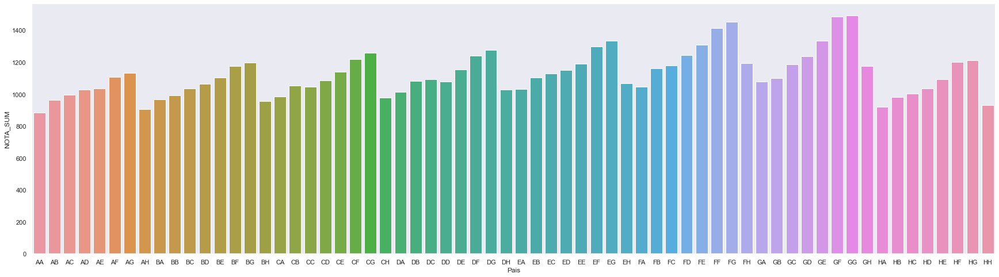

In [85]:
fig, ax = plt.subplots(figsize=(30,8))
sns.set_theme(style="dark")
sns.barplot(x="Pais", 
            y="NOTA_SUM",            
            data=df_mean,order=df_mean["Pais"].drop_duplicates().sort_values().values,ax=ax )

In [91]:
pais_formados = (df_mean[df_mean['Pais']=='GG']['NOTA_SUM'].values)
pais_nao_formados = (df_mean[df_mean['Pais']=='AA']['NOTA_SUM'].values)
pais_nao_formados[0]/pais_formados[0]

0.5928365660142985